In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
from sklearn.preprocessing import normalize

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

### Загружаем данные

In [2]:
df = pd.read_csv('./datasets/flats_moscow.csv', index_col=[0])

In [3]:
new_columns = ['price', 'total_space', 'living_space', 'kitchen_space', 'dist', 'metro_dist', 'walk', 'brick', 'floor']
df.pop('code')
df.columns = new_columns
count_cols = len(df.columns)
print(df.columns)

Index(['price', 'total_space', 'living_space', 'kitchen_space', 'dist',
       'metro_dist', 'walk', 'brick', 'floor'],
      dtype='object')


### Отобразим корреляцию параметров

In [65]:
def print_clusters(labels, X, cols):
    _, ax = plt.subplots(count_cols, count_cols, figsize=(50, 50))

    for i, col_f in enumerate(cols):
        for j, col_s in enumerate(cols):
            ax[i][j].scatter(X[:,i], X[:,j], c=labels, cmap='rainbow')

            ax[i][j].set_title(f'{col_f} - {col_s}')
            ax[i][j].set_xlabel(col_f)
            ax[i][j].set_ylabel(col_s)

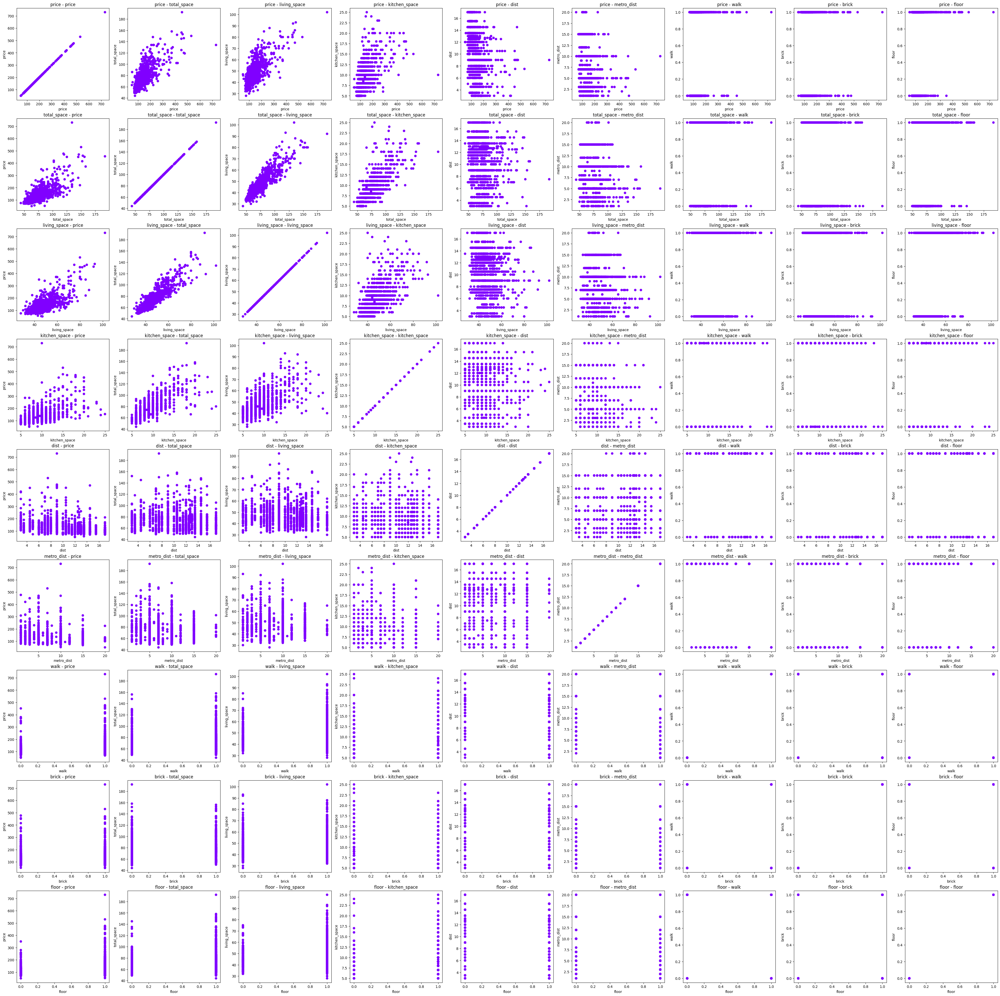

In [66]:
print_clusters(np.zeros((df.shape[0],)), df.to_numpy(), df.columns)

<Axes: >

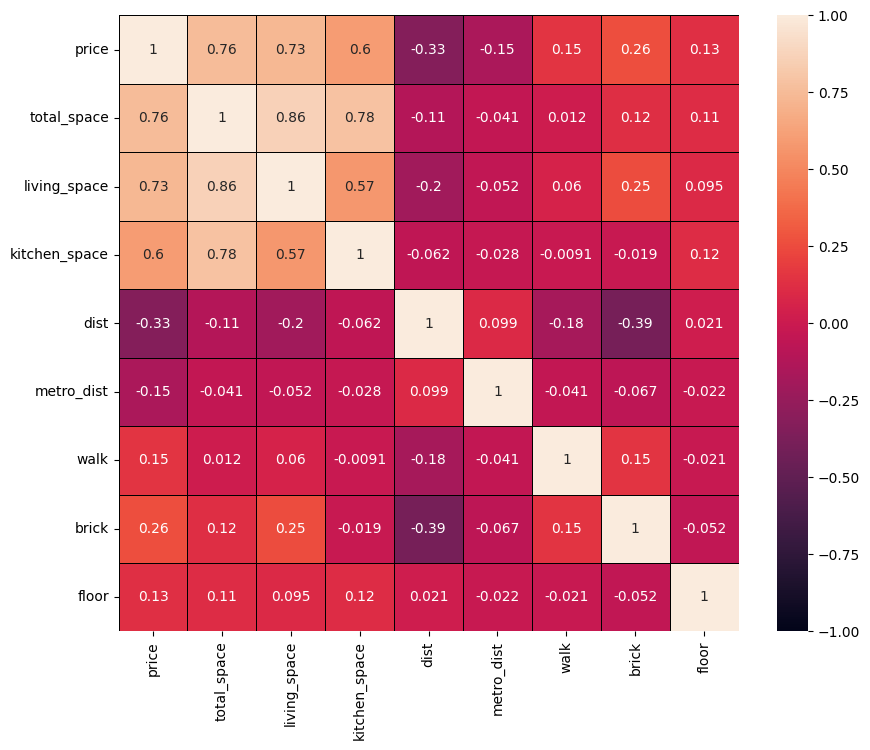

In [6]:
_, ax = plt.subplots(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, linecolor='black', ax=ax, vmin=-1, vmax=1)

In [67]:
x_norm = normalize(df)

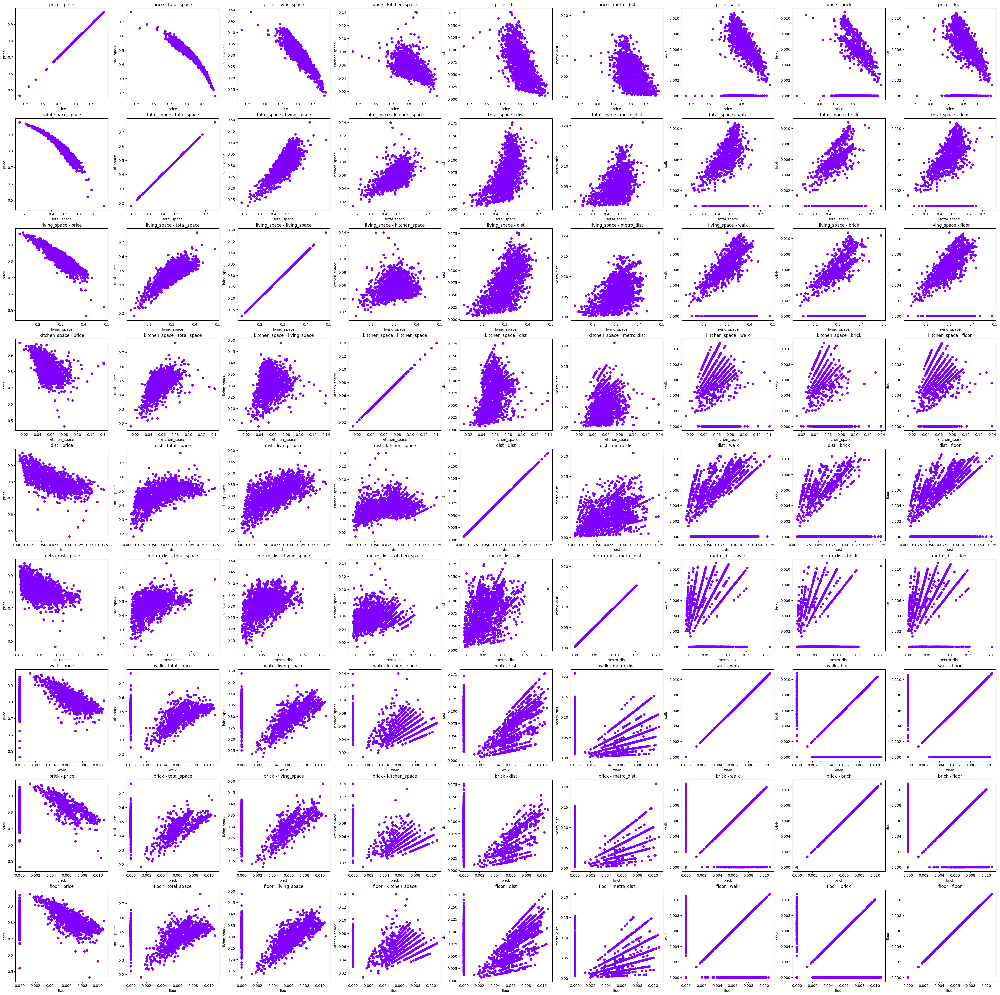

In [68]:
print_clusters(np.zeros((x_norm.shape[0],)), x_norm, df.columns)

Подберем количество кластеров для K-Means. Будем использовать метрики индекс Дэвиса-Болдуина (минимизировать) и индекс Калинского-Гарабача (максимизировать).

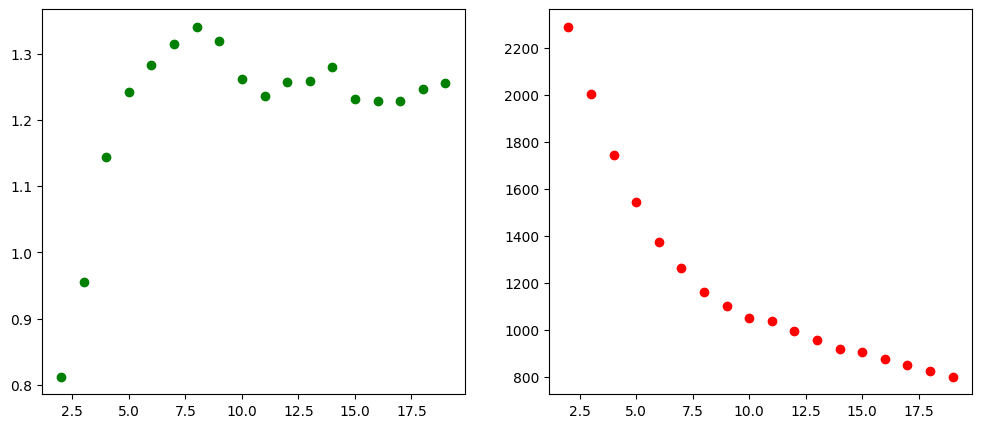

In [70]:
min_scores = []
max_scores = []
x = [i for i in range(2, 20)]

for n in x:
    kmeans = KMeans(n_clusters=n, n_init='auto', random_state=42).fit(x_norm)
    min_scores.append(davies_bouldin_score(x_norm, kmeans.labels_))
    max_scores.append(calinski_harabasz_score(x_norm, kmeans.labels_))

plt.figure(figsize=(12,5))
plt.subplot(121)
plt.scatter(x, min_scores, color='g')
plt.subplot(122)
plt.scatter(x, max_scores, color='r')
plt.show()

Видим, что наилучшее соотношение минимальный индекс Дэвиса-Болдуина и максимальный индекс Калинского-Гарабача достигается в районе 5

In [206]:
n_clusters = 6

Используя методы уменьшения размерности отобразим параметры на плоскости. Будем сравнивать два типа методов: PCA и UMAP (для сравнения возьмем также t-SNE)

In [72]:
pca = PCA(n_components=2, random_state=42)
x_pca = pca.fit(x_norm).transform(x_norm)

In [73]:
x_umap = UMAP(n_neighbors=5, random_state=42).fit_transform(x_norm)

In [74]:
x_tsne = TSNE(n_components=2, random_state=42).fit_transform(x_norm)

In [75]:
df.shape, x_pca.shape, x_umap.shape, x_tsne.shape

((2040, 9), (2040, 2), (2040, 2), (2040, 2))

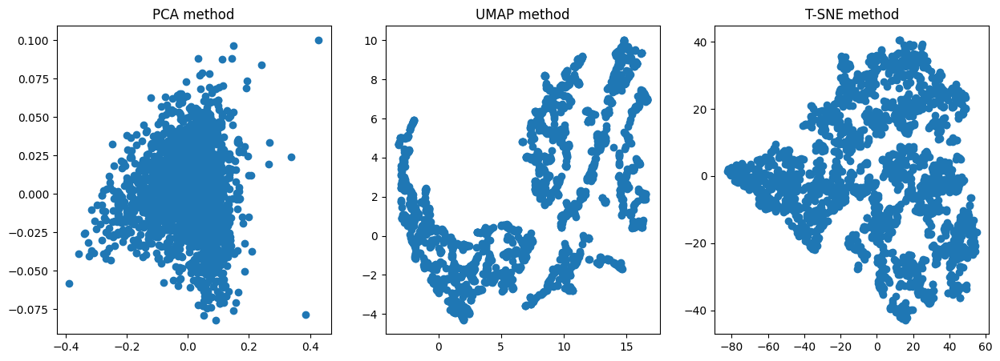

In [76]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.scatter(x_pca[:,0], x_pca[:,1])
plt.title('PCA method')

plt.subplot(132)
plt.scatter(x_umap[:,0], x_umap[:,1])
plt.title('UMAP method')

plt.subplot(133)
plt.scatter(x_tsne[:,0], x_tsne[:,1])
plt.title('T-SNE method')

plt.show()

Заметим, что PCA передает глобальную структуру множества объектов, а UMAP и t-SNE распределение объектов по плотности

### Получим кластеризацию с помощью K-Means

In [207]:
kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42).fit(x_norm)
print(f'Индекс Дэвиса-Болдуина: {round(davies_bouldin_score(x_norm, kmeans.labels_), 2)}, Индекс Калинского-Гарабача: {round(calinski_harabasz_score(x_norm, kmeans.labels_), 2)}')

Индекс Дэвиса-Болдуина: 1.28, Индекс Калинского-Гарабача: 1375.06


In [208]:
kmeans_pca = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42).fit(x_pca)
print(f'Индекс Дэвиса-Болдуина: {round(davies_bouldin_score(df, kmeans_pca.labels_), 2)}, Индекс Калинского-Гарабача: {round(calinski_harabasz_score(df, kmeans_pca.labels_), 2)}')

Индекс Дэвиса-Болдуина: 2.24, Индекс Калинского-Гарабача: 606.53


In [209]:
kmeans_umap = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42).fit(x_umap)
print(f'Индекс Дэвиса-Болдуина: {round(davies_bouldin_score(df, kmeans_umap.labels_), 2)}, Индекс Калинского-Гарабача: {round(calinski_harabasz_score(df, kmeans_umap.labels_), 2)}')

Индекс Дэвиса-Болдуина: 3.18, Индекс Калинского-Гарабача: 408.79


In [210]:
kmeans_tsne = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42).fit(x_tsne)
print(f'Индекс Дэвиса-Болдуина: {round(davies_bouldin_score(df, kmeans_pca.labels_), 2)}, Индекс Калинского-Гарабача: {round(calinski_harabasz_score(df, kmeans_pca.labels_), 2)}')

Индекс Дэвиса-Болдуина: 2.24, Индекс Калинского-Гарабача: 606.53


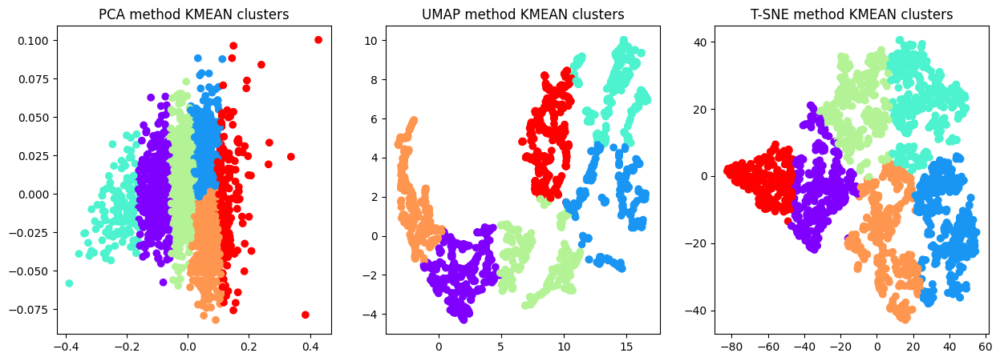

In [211]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.scatter(x_pca[:,0], x_pca[:,1], c=kmeans_pca.labels_, cmap='rainbow')
plt.title('PCA method KMEAN clusters')

plt.subplot(132)
plt.scatter(x_umap[:,0], x_umap[:,1], c=kmeans_umap.labels_, cmap='rainbow')
plt.title('UMAP method KMEAN clusters')

plt.subplot(133)
plt.scatter(x_tsne[:,0], x_tsne[:,1], c=kmeans_tsne.labels_, cmap='rainbow')
plt.title('T-SNE method KMEAN clusters')

plt.show()

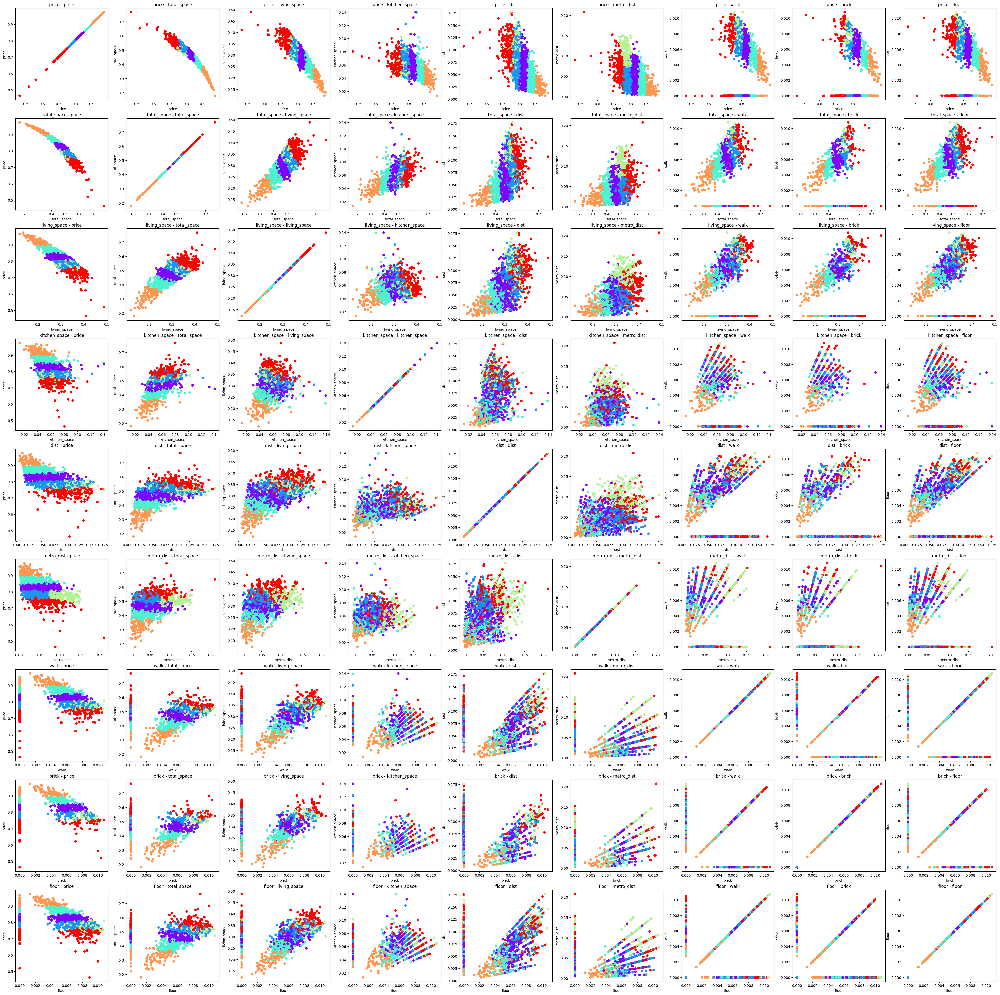

In [212]:
print_clusters(kmeans.labels_, x_norm, df.columns)

### Получим кластеризацию с помощью DBSCAN

In [177]:
dbscan_pca = DBSCAN(eps=0.01, min_samples=20).fit(x_pca)
print(len(np.unique(dbscan_pca.labels_)))

3


In [171]:
dbscan_umap = DBSCAN(eps=1, min_samples=10).fit(x_umap)
print(len(np.unique(dbscan_umap.labels_)))

3


In [194]:
dbscan_tsne = DBSCAN(eps=1.5, min_samples=10).fit(x_tsne)
print(len(np.unique(dbscan_tsne.labels_)))

9


In [143]:
dbscan = DBSCAN(eps=0.01, min_samples=5).fit(x_norm)
print(len(np.unique(dbscan.labels_)))
# print(f'Индекс Дэвиса-Болдуина: {round(davies_bouldin_score(x_norm, dbscan.labels_), 2)}, Индекс Калинского-Гарабача: {round(calinski_harabasz_score(x_norm, dbscan.labels_), 2)}')

4


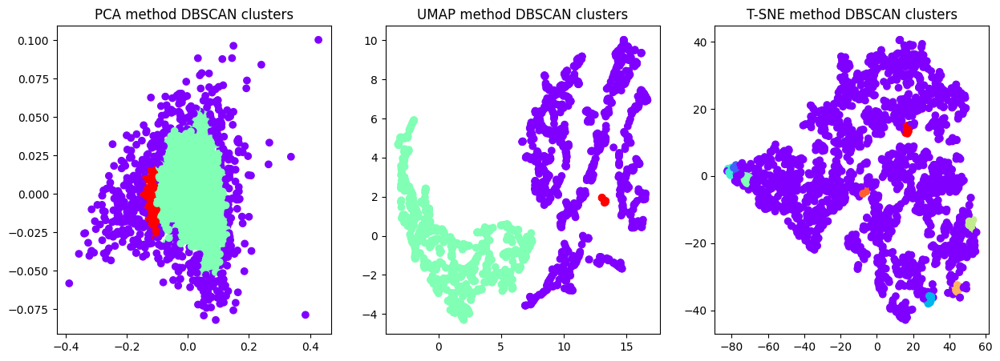

In [195]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.scatter(x_pca[:,0], x_pca[:,1], c=dbscan_pca.labels_, cmap='rainbow')
plt.title('PCA method DBSCAN clusters')

plt.subplot(132)
plt.scatter(x_umap[:,0], x_umap[:,1], c=dbscan_umap.labels_, cmap='rainbow')
plt.title('UMAP method DBSCAN clusters')

plt.subplot(133)
plt.scatter(x_tsne[:,0], x_tsne[:,1], c=dbscan_tsne.labels_, cmap='rainbow')
plt.title('T-SNE method DBSCAN clusters')

plt.show()

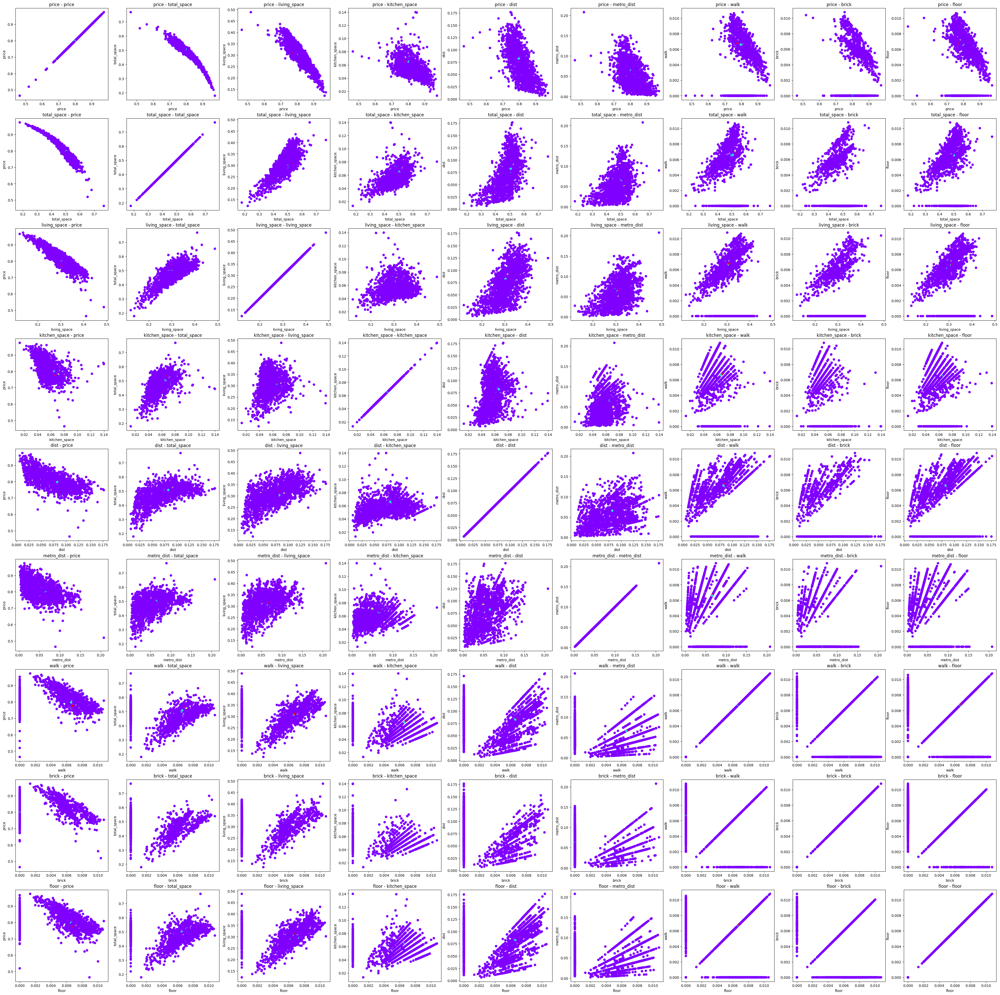

In [144]:
print_clusters(dbscan.labels_, x_norm, df.columns)